In [1]:
from IPython.display import display, HTML
import pandas as pd
import sqlite3
from sqlite3 import Error

def create_connection(db_file, delete_db=False):
    import os
    if delete_db and os.path.exists(db_file):
        os.remove(db_file)

    conn = None
    try:
        conn = sqlite3.connect(db_file)
        conn.execute("PRAGMA foreign_keys = 1")
    except Error as e:
        print(e)

    return conn


def create_table(conn, create_table_sql, drop_table_name=None):
    
    if drop_table_name: # You can optionally pass drop_table_name to drop the table. 
        try:
            c = conn.cursor()
            c.execute("""DROP TABLE IF EXISTS %s""" % (drop_table_name))
        except Error as e:
            print(e)
    
    try:
        c = conn.cursor()
        c.execute(create_table_sql)
    except Error as e:
        print(e)
        
def execute_sql_statement(sql_statement, conn):
    cur = conn.cursor()
    cur.execute(sql_statement)

    rows = cur.fetchall()

    return rows

In [2]:
# Delete old database file

normalized_database_filename = 'normalized.db'
conn = create_connection(normalized_database_filename, delete_db=True)

In [3]:
def create_facility_table(data_filename, normalized_database_filename):

    conn = create_connection(normalized_database_filename)
    
    create_table_facility_sql = """ CREATE TABLE [Facility] (
        [Object_ID] Integer not null primary key,
        [Unit_ID] Text,
        [Fire_Bldg_ID] Text,
        [Building_ID] Text,
        [FMSS_ID] Text,
        [Community_ID] Text,
        [Global_ID] Text,
        [Create_Date] Text,
        [Edit_Date] Text,
        [Score] Integer,
        [Rating] Text
    ); """
        
    facilities = []
    with open(data_filename) as file:
        for line in file:
            line = line.strip('\n')
            if line.startswith('X'):
                continue
            object_id = line.split(',')[2]
            unit_id = line.split(',')[3]
            fire_building_id = line.split(',')[4]
            building_id = line.split(',')[5]
            fmss_id = line.split(',')[6]
            community_id = line.split(',')[7]
            global_id = line.split(',')[58]
            create_date = line.split(',')[57]
            edit_date = line.split(',')[56]
            score = line.split(',')[44]
            rating = line.split(',')[45]
            facility_tuple = (object_id,unit_id,fire_building_id,building_id,fmss_id,community_id,global_id,create_date,edit_date,score,rating)
            facilities.append(facility_tuple)
    
    def insert_facility(conn, values):
        sql =  """INSERT INTO Facility(Object_ID, Unit_ID, Fire_Bldg_ID, Building_ID, FMSS_ID, Community_ID, Global_ID,
                Create_Date, Edit_Date, Score, Rating) VALUES (?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?)"""
        cur = conn.cursor()
        cur.executemany(sql, values)
        return cur.lastrowid
    
    with conn:
        create_table(conn, create_table_facility_sql, "Facility")
        insert_facility(conn, facilities)
        
    sql_statement = "select * from Facility"
    df = pd.read_sql_query(sql_statement, conn)
    display(df)
    
data_filename = 'Project.csv'
normalized_database_filename = 'normalized.db'
create_facility_table(data_filename, normalized_database_filename)

,Object_ID,Unit_ID,Fire_Bldg_ID,Building_ID,FMSS_ID,Community_ID,Global_ID,Create_Date,Edit_Date,Score,Rating
0,1,AZSAP,{6015F557-0D33-4FC7-A984-C813C43B2994},,,,{CE5AE3C5-159C-4044-8B21-6CBB48C82FA5},2013/02/01 13:15:28+00,2019/03/28 13:27:59+00,89,High
1,2,NMBAP,{898FD9CA-8C6C-4222-BC43-AE3B2602DDF4},{896BC94C-D42E-4D16-A813-3B78863AA20F},46721,{465E7E5A-6B1C-4F80-BAF3-71E002995D1D},{D4D782EE-2317-489A-A190-BCA4E18AD398},1970/01/01 00:00:00+00,2017/08/02 17:44:20+00,,Not Surveyed
2,3,AZCGP,{1C1746E5-A3D5-4A1B-A90A-F54EE821CF95},{80FAB141-7A6A-4DF5-8FFC-228061BD22A2},,{663E18C6-780A-4973-BF32-520302AD4580},{46352A0A-2C93-4AEF-865D-BEECC204A522},1970/01/01 00:00:00+00,2019/08/19 22:28:18+00,47,Moderate
3,4,AZCGP,{6751BCDC-E4BA-4B62-B300-C5F266155773},{90339201-D4B4-4766-B7A2-ED27504F3BDB},,{663E18C6-780A-4973-BF32-520302AD4580},{499B63A1-F251-45EB-839D-F0390BEF84A8},1970/01/01 00:00:00+00,2019/08/19 22:28:18+00,15,Low
4,5,AZCGP,{B3272E96-4C05-4640-BB0B-263CBB5A0F7A},{2B3E66A5-7370-43E3-A947-8A0EC6C904B9},,{663E18C6-780A-4973-BF32-520302AD4580},{851F4C2B-A2A3-4188-9885-6F4E4CE49461},1970/01/01 00:00:00+00,2019/08/19 22:28:18+00,15,Low
...,...,...,...,...,...,...,...,...,...,...,...
44392,73169,MTGKP,{596D46C8-420C-4BB2-AB1D-DA9B795AA818},,,{CF823C6A-546F-4A0F-A637-A4104EC6C837},{A22AE299-D65F-4ED8-9FD2-F738D858970D},2020/09/25 17:37:54+00,2020/10/02 17:59:41+00,71,High
44393,73170,MTGKP,{4346F754-FDCD-4B52-8BFA-898C1ADB3D60},,,,{E1625D66-D0EB-4ADB-AE65-6359A087089F},2020/09/25 17:45:14+00,2020/10/02 17:59:41+00,54,Moderate
44394,73174,MTGKP,{224271C8-A5E6-42AA-A7B5-A44F27A57969},,,,{8C5915E5-E631-4DB4-A90F-60DFD3C62F52},2020/09/25 18:32:26+00,2020/10/02 17:59:41+00,56,Moderate
44395,73558,MTGKP,{82A80C8D-B80B-47C5-8825-E395A3280409},,No FMSS,,{A91AB18A-D96A-4355-A4F7-448DA367AD36},2020/09/25 18:43:43+00,2020/10/02 17:59:41+00,52,Moderate


In [4]:
def create_facility_info_table(data_filename, normalized_database_filename):

    conn = create_connection(normalized_database_filename)
    
    create_table_facility_info_sql = """ CREATE TABLE [Facility_Info] (
        [Object_ID] Integer not null primary key,
        [Common_Name] Text,
        [Owner] Text,
        [FacilityType] Text,
        [FacilityUse] Text,
        [BuildingOccupied] Text,
        [Restriction] Text,
        [Community_ID] Text,
        [Last_Site_Visit_Date] Text,
        [F_AccProScore] Integer,
        [C_AccProScore] Integer,
        [AssessScale] Text,
        [CommunityName] Text,
        FOREIGN KEY(Object_ID) REFERENCES Facility(Object_ID)
    ); """
        
    facility_info_list = []
    with open(data_filename) as file:
        for line in file:
            line = line.strip('\n')
            if line.startswith('X'):
                continue
            object_id = line.split(',')[2]
            common_name = line.split(',')[9]
            owner = line.split(',')[11]
            facility_type = line.split(',')[12]
            facility_use = line.split(',')[13]
            building_occupied = line.split(',')[14]
            restriction = line.split(',')[64]
            community_id = line.split(',')[7]
            last_visited_date = line.split(',')[16]
            facility_access_protection_score = line.split(',')[43]
            community_access_protection_score = line.split(',')[42]
            assess_scale = line.split(',')[8]
            community_name = line.split(',')[15]
            facility_info_tuple = (object_id,common_name,owner,facility_type,facility_use,building_occupied,restriction,community_id,last_visited_date,facility_access_protection_score,community_access_protection_score,assess_scale,community_name)
            facility_info_list.append(facility_info_tuple)
    
    def insert_facility_info(conn, values):
        sql =  """INSERT INTO Facility_Info(Object_ID, Common_Name, Owner, FacilityType, FacilityUse, BuildingOccupied, 
                Restriction, Community_ID, Last_Site_Visit_Date, F_AccProScore, C_AccProScore, AssessScale,CommunityName) VALUES (?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?)"""
        cur = conn.cursor()
        cur.executemany(sql, values)
        return cur.lastrowid
    
    with conn:
        create_table(conn, create_table_facility_info_sql, "Facility_Info")
        insert_facility_info(conn, facility_info_list)
        
    sql_statement = "select * from Facility_Info;"
    df = pd.read_sql_query(sql_statement, conn)
    display(df)

data_filename = 'Project.csv'
normalized_database_filename = 'normalized.db'
create_facility_info_table(data_filename, normalized_database_filename)

,Object_ID,Common_Name,Owner,FacilityType,FacilityUse,BuildingOccupied,Restriction,Community_ID,Last_Site_Visit_Date,F_AccProScore,C_AccProScore,AssessScale,CommunityName
0,1,Grass Shack vault toilet,NPS,Other,Public,N,UNR,,2013/02/01 13:30:41+00,,,N,
1,2,WR 44 OLD HOUSING,NPS,Building,Residence,Y,UNR,{465E7E5A-6B1C-4F80-BAF3-71E002995D1D},2008/12/14 00:00:00+00,,37,Y,Frijoles Canyon
2,3,Shade Structure,NPS,Shade,Public,N,UNR,{663E18C6-780A-4973-BF32-520302AD4580},2019/06/13 14:02:17+00,,8,Y,Casa Grande National Monument
3,4,Picnic Shelter,NPS,Shade,Public,N,UNR,{663E18C6-780A-4973-BF32-520302AD4580},2018/03/13 13:46:48+00,,8,Y,Casa Grande National Monument
4,5,Picnic Shelter,NPS,Shade,Public,N,UNR,{663E18C6-780A-4973-BF32-520302AD4580},2018/03/13 13:50:03+00,,8,Y,Casa Grande National Monument
...,...,...,...,...,...,...,...,...,...,...,...,...,...
44392,73169,Box & Cattle Cars (Railroad),NPS,Other,NotApplicable,N,UNR,{CF823C6A-546F-4A0F-A637-A4104EC6C837},2019/09/16 06:00:00+00,,9,N,Visitors Center
44393,73170,Hay Pile,NPS,Other,NotApplicable,N,UNR,,2019/09/17 06:00:00+00,,,N,
44394,73174,Jenkins Hay Lift,NPS,CulturalResource,NotApplicable,N,UNR,,2019/09/17 06:00:00+00,,,N,
44395,73558,West Hay Stack,NPS,Other,NotApplicable,N,UNR,,2019/09/17 06:00:00+00,,,N,


In [5]:
def create_facility_location_table(data_filename, normalized_database_filename):

    conn = create_connection(normalized_database_filename)
    
    create_table_facility_location_sql = """ CREATE TABLE [Facility_Location] (
        [Object_ID] integer not null primary key, 
        [Location] text,
        [Region_Code] text,
        [Group_Code] text,
        [Data_Source] text,
        [Latitude] real,
        [Longitude] real,
        FOREIGN KEY(Object_ID) REFERENCES Facility(Object_ID)
    ); """
        
    facility_location_list = []
    with open(data_filename) as file:
        for line in file:
            line = line.strip('\n')
            if line.startswith('X'):
                continue
            object_id = line.split(',')[2]
            location = line.split(',')[17]
            region_code = line.split(',')[52]
            group_code = line.split(',')[53]
            data_source = line.split(',')[55]
            latitude = line.split(',')[1]
            longitude = line.split(',')[0]
            facility_location_tuple = (object_id,location,region_code,group_code,data_source,latitude,longitude)
            facility_location_list.append(facility_location_tuple)
    
    def insert_facility_location(conn, values):
        sql =  """INSERT INTO Facility_Location(Object_ID, Location, Region_Code, Group_Code, 
                Data_Source, Latitude, Longitude) VALUES (?, ?, ?, ?, ?, ?, ?)"""
        cur = conn.cursor()
        cur.executemany(sql, values)
        return cur.lastrowid
    
    with conn:
        create_table(conn, create_table_facility_location_sql, "Facility_Location")
        insert_facility_location(conn, facility_location_list)
        
    sql_statement = "select * from Facility_Location;"
    df = pd.read_sql_query(sql_statement, conn)
    display(df)

data_filename = 'Project.csv'
normalized_database_filename = 'normalized.db'
create_facility_location_table(data_filename, normalized_database_filename)

,Object_ID,Location,Region_Code,Group_Code,Data_Source,Latitude,Longitude
0,1,SAGU,IMR,SAGU,GPS,32.1838,-110.592
1,2,Headquarters / Visitors Center,IMR,BAND,Unknown,35.7719,-106.266
2,3,CAGR,IMR,CAGR,ArcGIS feature to point tool was used.,32.9944,-111.537
3,4,CAGR,IMR,CAGR,ArcGIS feature to point tool was used.,32.9956,-111.536
4,5,CAGR,IMR,CAGR,ArcGIS feature to point tool was used.,32.9958,-111.536
...,...,...,...,...,...,...,...
44392,73169,Visitors Center,IMR,,,46.4098,-112.738
44393,73170,Grant Kohrs,IMR,,,46.4066,-112.741
44394,73174,Grant Kohrs,IMR,,,46.4144,-112.753
44395,73558,West field of Grant Kohrs,IMR,,,46.4042,-112.747


In [6]:
def create_community_table(data_filename, normalized_database_filename):

    conn = create_connection(normalized_database_filename)
    
    create_table_community_sql = """ CREATE TABLE [Community] (
        [Index] integer not null primary key,
        [Community_ID] Text,
        [Community_Name] Text,
        [C_AccProScore] Integer
    ); """
        
    community_list = []
    with open(data_filename) as file:
        for line in file:
            line = line.strip('\n')
            if line.startswith('X'):
                continue
            object_id = line.split(',')[2]
            community_id = line.split(',')[7]
            community_id = community_id.replace('{', '').replace('}', '').strip()
            community_name = line.split(',')[15]
            community_access_protection_score = line.split(',')[42]
            for ele1, ele2, ele3 in zip(community_id, community_name, community_access_protection_score):
                if ele1 == '' and ele2 == '' and ele3 == '':
                    continue
                community_tuple = (community_id, community_name,community_access_protection_score)
                if community_tuple not in community_list:
                    community_list.append(community_tuple)
    
    def insert_community(conn, values):
        sql = "INSERT INTO Community(Community_ID,  Community_Name, C_AccProScore) VALUES ( ?, ?, ?)"
        cur = conn.cursor()
        cur.executemany(sql, values)
        return cur.lastrowid
    
    with conn:
        create_table(conn, create_table_community_sql, "Community")
        insert_community(conn, community_list)
        
    sql_statement = "select * from Community;"
    df = pd.read_sql_query(sql_statement, conn)
    display(df)

data_filename = 'Project.csv'
normalized_database_filename = 'normalized.db'
create_community_table(data_filename, normalized_database_filename)

,Index,Community_ID,Community_Name,C_AccProScore
0,1,465E7E5A-6B1C-4F80-BAF3-71E002995D1D,Frijoles Canyon,37
1,2,663E18C6-780A-4973-BF32-520302AD4580,Casa Grande National Monument,8
2,3,02516607-DDE7-4FB8-92E6-4B961123BA97,Montezuma Castle,15
3,4,8070EA3D-AB58-4108-A41F-E622221484ED,Montezuma Well,24
4,5,8070EA3D-AB58-4108-A41F-E622221484ED,Montezuma Well,23
...,...,...,...,...
1154,1155,398B737B-C7D6-4A4C-90E5-DA742EFB92F9,Maintenance Facility,18
1155,1156,25F9F997-15E0-4A67-A80D-3BA5D148EFF5,Aialik Bay Ranger Station,37
1156,1157,6750ABA2-C7F7-4404-A68E-806F14250814,Harkers Island Visitor Center,14
1157,1158,9D3A98D8-9C18-4F2E-95EC-777530E824FC,Shaefer Complex,28


In [7]:
def create_access_table(data_filename, normalized_database_filename):

    conn = create_connection(normalized_database_filename)
    
    create_table_access_sql = """ CREATE TABLE [Access] (
        [Object_ID] Integer not null primary key,
        [PrimaryAccess] Text,
        [IngressEgress] Integer,
        [AccessWidth] Integer,
        [AccessCond] Integer,
        [BridgeCond] Integer,
        [Turnaround] Integer,
        [BldgNum] Integer
    ); """
        
    access_list = []
    with open(data_filename) as file:
        for line in file:
            line = line.strip('\n')
            if line.startswith('X'):
                continue
            object_id = line.split(',')[2]
            primary_access = line.split(',')[18]
            ingress_egress = line.split(',')[19]
            access_width = line.split(',')[20]
            access_condition = line.split(',')[21]
            bridge_condition = line.split(',')[22]
            turn_around = line.split(',')[23]
            building_number = line.split(',')[24]
            access_tuple = (object_id,primary_access,ingress_egress,access_width,access_condition,bridge_condition,turn_around,building_number)
            access_list.append(access_tuple)
    
    def insert_access(conn, values):
        sql =  "INSERT INTO Access(Object_ID, PrimaryAccess, IngressEgress, AccessWidth, AccessCond, BridgeCond, Turnaround, BldgNum) VALUES (?, ?, ?, ?, ?, ?, ?, ?)"
        cur = conn.cursor()
        cur.executemany(sql, values)
        return cur.lastrowid
    
    with conn:
        create_table(conn, create_table_access_sql, "Access")
        insert_access(conn, access_list)
        
    sql_statement = "select * from Access;"
    df = pd.read_sql_query(sql_statement, conn)
    display(df)

data_filename = 'Project.csv'
normalized_database_filename = 'normalized.db'
create_access_table(data_filename, normalized_database_filename)

,Object_ID,PrimaryAccess,IngressEgress,AccessWidth,AccessCond,BridgeCond,Turnaround,BldgNum
0,1,Foot,7,4,7,0,4,4
1,2,Road,6,0,2,3,2,0
2,3,Road,6,2,0,0,0,0
3,4,Road,6,2,0,0,0,0
4,5,Road,6,2,0,0,0,0
...,...,...,...,...,...,...,...,...
44392,73169,Road,6,3,3,0,1,4
44393,73170,Road,6,3,3,0,1,4
44394,73174,Road,0,3,0,0,1,4
44395,73558,Road,0,3,3,0,1,4


In [8]:
def create_envt_table(data_filename, normalized_database_filename):

    conn = create_connection(normalized_database_filename)
    
    create_table_envt_sql = """ CREATE TABLE [Environment] (
        [Object_ID] Integer not null primary key,
        [FuelLoad] Integer,
        [FuelType] Integer,
        [DefensibleSpace] Integer,
        [Topography] Integer
    ); """
        
    envt_list = []
    with open(data_filename) as file:
        for line in file:
            line = line.strip('\n')
            if line.startswith('X'):
                continue
            object_id = line.split(',')[2]
            fuel_load = line.split(',')[25]
            fuel_type = line.split(',')[26]
            defensible_space = line.split(',')[27]
            topography = line.split(',')[28]
            envt_tuple = (object_id,fuel_load,fuel_type,defensible_space,topography)
            envt_list.append(envt_tuple)
    
    def insert_envt(conn, values):
        sql =  "INSERT INTO Environment(Object_ID, FuelLoad, FuelType, DefensibleSpace, Topography) VALUES (?, ?, ?, ?, ?)"
        cur = conn.cursor()
        cur.executemany(sql, values)
        return cur.lastrowid
    
    with conn:
        create_table(conn, create_table_envt_sql, "Environment")
        insert_envt(conn, envt_list)
        
    sql_statement = "select * from Environment;"
    df = pd.read_sql_query(sql_statement, conn)
    display(df)

data_filename = 'Project.csv'
normalized_database_filename = 'normalized.db'
create_envt_table(data_filename, normalized_database_filename)

,Object_ID,FuelLoad,FuelType,DefensibleSpace,Topography
0,1,10,6,25,4
1,2,10,10,10,4
2,3,0,6,1,0
3,4,0,6,1,0
4,5,0,6,1,0
...,...,...,...,...,...
44392,73169,0,4,25,0
44393,73170,0,4,25,0
44394,73174,4,4,25,4
44395,73558,4,4,25,0


In [9]:
def create_structure_table(data_filename, normalized_database_filename):

    conn = create_connection(normalized_database_filename)
    
    create_table_structure_sql = """ CREATE TABLE [Structure] (
        [Object_ID] Integer not null primary key,
        [RoofMat] Integer,
        [SidingMat] Integer,
        [Foundation] Integer,
        [Fencing] Integer,
        [Firewood] Integer
    ); """
        
    structures = []
    with open(data_filename) as file:
        for line in file:
            line = line.strip('\n')
            if line.startswith('X'):
                continue
            object_id = line.split(',')[2]
            roof_material = line.split(',')[29]
            siding_material = line.split(',')[30]
            foundation = line.split(',')[31]
            fencing = line.split(',')[32]
            firewood = line.split(',')[33]
            structure_tuple = (object_id,roof_material,siding_material,foundation,fencing,firewood)
            structures.append(structure_tuple)
    
    def insert_structure(conn, values):
        sql =  "INSERT INTO Structure(Object_ID, RoofMat, SidingMat, Foundation, Fencing, Firewood) VALUES (?, ?, ?, ?, ?, ?)"
        cur = conn.cursor()
        cur.executemany(sql, values)
        return cur.lastrowid
    
    with conn:
        create_table(conn, create_table_structure_sql, "Structure")
        insert_structure(conn, structures)
        
    sql_statement = "select * from Structure;"
    df = pd.read_sql_query(sql_statement, conn)
    # display(df)

data_filename = 'Project.csv'
normalized_database_filename = 'normalized.db'
create_structure_table(data_filename, normalized_database_filename)

In [10]:
def create_protection_table(data_filename, normalized_database_filename):

    conn = create_connection(normalized_database_filename)
    
    create_table_protection_sql = """ CREATE TABLE [Protection] (
        [Object_ID] Integer not null primary key,
        [Propane] Integer,
        [Hazmat] Text,
        [WaterSupply] Integer,
        [OverheadHaz] Integer,
        [SafetyZone] Integer,
        [SZRadius] Integer,
        [Obstacles] Integer,
        [TriageCategory] Text,
        [ProtectionLevel] Text,
        [ResourcesOfConcern] Text
    ); """
        
    protection_list = []
    with open(data_filename) as file:
        for line in file:
            line = line.strip('\n')
            if line.startswith('X'):
                continue
            object_id = line.split(',')[2]
            propane = line.split(',')[34]
            hazardous_material = line.split(',')[35]
            water_supply = line.split(',')[36]
            overhead_hazards = line.split(',')[37]
            safety_zones = line.split(',')[38]
            safety_zone_radius = line.split(',')[39]
            obstacles = line.split(',')[40]
            triage_category = line.split(',')[41]
            protection_level = line.split(',')[46]
            resources_of_concern = line.split(',')[49]
            protection_tuple = (object_id,propane,hazardous_material,water_supply,overhead_hazards,safety_zones,safety_zone_radius,obstacles,triage_category,protection_level,resources_of_concern)
            protection_list.append(protection_tuple)
    
    def insert_protection(conn, values):
        sql =  """INSERT INTO Protection(Object_ID, Propane, Hazmat, WaterSupply, OverheadHaz, SafetyZone,
                SZRadius, Obstacles, TriageCategory, ProtectionLevel, ResourcesOfConcern) 
                VALUES (?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?)"""
        cur = conn.cursor()
        cur.executemany(sql, values)
        return cur.lastrowid
    
    with conn:
        create_table(conn, create_table_protection_sql, "Protection")
        insert_protection(conn, protection_list)
        
    sql_statement = "select * from Protection;"
    df = pd.read_sql_query(sql_statement, conn)
    display(df)

data_filename = 'Project.csv'
normalized_database_filename = 'normalized.db'
create_protection_table(data_filename, normalized_database_filename)

,Object_ID,Propane,Hazmat,WaterSupply,OverheadHaz,SafetyZone,SZRadius,Obstacles,TriageCategory,ProtectionLevel,ResourcesOfConcern
0,1,0,NA,10,0,3,,0,,Not Designated,Unknown
1,2,,,10,3,3,,3,,Not Designated,Unknown
2,3,,,0,0,0,,0,PrepHold,Not Designated,Unknown
3,4,,,0,0,0,,0,PrepHold,Not Designated,Unknown
4,5,,,0,0,0,,0,PrepHold,Not Designated,Unknown
...,...,...,...,...,...,...,...,...,...,...,...
44392,73169,0,,3,0,0,100,0,PrepHold,,Yes
44393,73170,0,,3,0,0,100,0,PrepHold,,No
44394,73174,0,,3,0,0,100,0,PrepHold,,Yes
44395,73558,0,,3,0,0,100,0,PrepHold,,No


In [11]:
sql_statement = """ Select * From Facility_Location
                        INNER JOIN Facility_Info USING(Object_ID)
                        INNER JOIN Access USING(Object_ID)
                        INNER JOIN Environment USING(Object_ID) 
                        INNER JOIN Structure USING(Object_ID)
                        INNER JOIN Protection USING(Object_ID)
                        INNER JOIN Facility USING(Object_ID)
                        
                        """
df = pd.read_sql_query(sql_statement, conn)

df=df[['Latitude', 'Longitude', 'AssessScale', 'Common_Name', 'Owner', 'FacilityType', 'FacilityUse', 'BuildingOccupied', 'CommunityName', 'Last_Site_Visit_Date', 'Location', 'PrimaryAccess', 'IngressEgress', 'AccessWidth', 'AccessCond', 'BridgeCond', 'Turnaround', 'BldgNum', 'FuelLoad',	'FuelType',	'DefensibleSpace',	'Topography',	'RoofMat',	'SidingMat',	'Foundation',	'Fencing',	'Firewood',	'Propane',	'Hazmat',	'WaterSupply',	'OverheadHaz',	'SafetyZone',	'SZRadius',	'Obstacles',	'TriageCategory', 'C_AccProScore',	'F_AccProScore',  'Score',	'Rating']]

# replace field that's entirely space (or empty) with NaN
import numpy as np
df = df.replace(r'^\s*$', np.nan, regex=True)

df.head()

,Latitude,Longitude,AssessScale,Common_Name,Owner,FacilityType,FacilityUse,BuildingOccupied,CommunityName,Last_Site_Visit_Date,...,WaterSupply,OverheadHaz,SafetyZone,SZRadius,Obstacles,TriageCategory,C_AccProScore,F_AccProScore,Score,Rating
0,32.183823,-110.592244,N,Grass Shack vault toilet,NPS,Other,Public,N,NaN,2013/02/01 13:30:41+00,...,10.0,0.0,3.0,NaN,0.0,NaN,NaN,NaN,89.0,High
1,35.771942,-106.265777,Y,WR 44 OLD HOUSING,NPS,Building,Residence,Y,Frijoles Canyon,2008/12/14 00:00:00+00,...,10.0,3.0,3.0,NaN,3.0,NaN,37.0,NaN,NaN,Not Surveyed
2,32.994448,-111.537037,Y,Shade Structure,NPS,Shade,Public,N,Casa Grande National Monument,2019/06/13 14:02:17+00,...,0.0,0.0,0.0,NaN,0.0,PrepHold,8.0,NaN,47.0,Moderate
3,32.995553,-111.536253,Y,Picnic Shelter,NPS,Shade,Public,N,Casa Grande National Monument,2018/03/13 13:46:48+00,...,0.0,0.0,0.0,NaN,0.0,PrepHold,8.0,NaN,15.0,Low
4,32.995787,-111.536455,Y,Picnic Shelter,NPS,Shade,Public,N,Casa Grande National Monument,2018/03/13 13:50:03+00,...,0.0,0.0,0.0,NaN,0.0,PrepHold,8.0,NaN,15.0,Low


In [12]:
# Commented out IPython magic to ensure Python compatibility.
#@title
import random
import numpy as np 
import pandas as pd
#import pydotplus
import matplotlib.pyplot as plt
import seaborn as sns
# from xgboost import XGBClassifier
# import xgboost as xgb
from sklearn import tree
from sklearn import metrics
from sklearn.ensemble import AdaBoostClassifier, RandomForestRegressor, RandomForestClassifier
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV 
from sklearn.metrics import confusion_matrix, classification_report, roc_curve
from sklearn.metrics import accuracy_score, roc_auc_score, recall_score, precision_score,f1_score
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import mean_squared_error as MSE
# Import LogisticRegression from sklearn.linear_model
from sklearn.linear_model import LogisticRegression
#Import knearest neighbors Classifier model
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from itertools import product
from sklearn.model_selection import cross_val_score
# Import models and utility functions
from sklearn.ensemble import BaggingClassifier
from sklearn.model_selection import train_test_split
import matplotlib
# %matplotlib inline

In [13]:

# Bokeh libraries
from bokeh.io import output_notebook
from bokeh.plotting import figure, show

# My word count data
day_num = np.linspace(1, 30108, 200)
daily_words = df['Score']
cumulative_words = np.cumsum(daily_words)

# Output the visualization directly in the notebook
output_notebook()

# Create a figure with a datetime type x-axis
fig = figure(title='Facility Score Report',
             plot_height=400, plot_width=700,
             x_axis_label='No. of Survey', y_axis_label='Scores',
             x_minor_ticks=2,
             toolbar_location=None)

# The daily words will be represented as vertical bars (columns)
fig.vbar(x=day_num, bottom=0, top=daily_words, 
         color='blue', width=0.75, 
         legend='Each Survey')

# The cumulative sum will be a trend line
fig.line(x=day_num, y=cumulative_words, 
         color='red', line_width=1,
         legend='Cumulative Scores')

# Put the legend in the upper left corner
fig.legend.location = 'top_left'

# Let's check it out
show(fig)

Loading BokehJS ...

In [14]:

# Bokeh libraries
from bokeh.io import output_notebook
from bokeh.plotting import figure, show

# My word count data
day_num = np.linspace(1, 30108, 200)
daily_words = df['C_AccProScore']
cumulative_words = np.cumsum(daily_words)

# Output the visualization directly in the notebook
output_notebook()

# Create a figure with a datetime type x-axis
fig = figure(title='Community Access and Protection Score Report',
             plot_height=400, plot_width=700,
             x_axis_label='No. of Survey', y_axis_label='Community Access Scores',
             x_minor_ticks=2,
             toolbar_location=None)

# The daily words will be represented as vertical bars (columns)
fig.vbar(x=day_num, bottom=0, top=daily_words, 
         color='blue', width=0.75, 
         legend='Each Survey')

# The cumulative sum will be a trend line
fig.line(x=day_num, y=cumulative_words, 
         color='red', line_width=1,
         legend='Cumulative Scores')

# Put the legend in the upper left corner
fig.legend.location = 'top_left'

# Let's check it out
show(fig)

Loading BokehJS ...

In [15]:
df.dropna(subset = ['Rating', "Score"], inplace=True)
df.loc[df['Rating'] == "PVTNotSurveyed", "Rating"] = "Not_Surveyed"
df.loc[df['Rating'] == "None", "Rating"] = "Not_Surveyed"
df.loc[df['Rating'] == "Not Surveyed", "Rating"] = "Not_Surveyed"
df.loc[df['Rating'] == "SRVNotRequired", "Rating"] = "NoWildlandRisk"
df.shape

(30201, 39)

In [16]:
#%pip install altair
import altair as alt
import pandas as pd

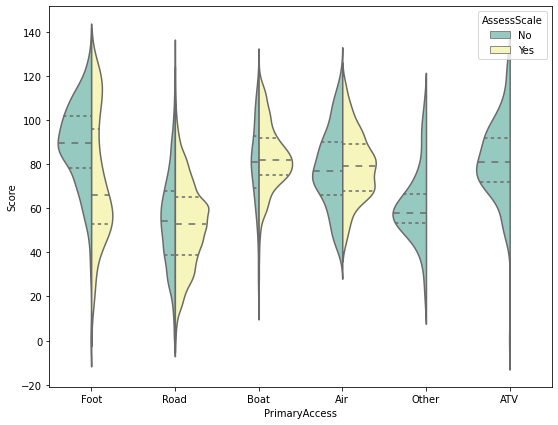

In [17]:
# %%
df.loc[df['AssessScale'] == "Y", "AssessScale"] = "Yes"
df.loc[df['AssessScale'] == "N", "AssessScale"] = "No"
df.loc[df['AssessScale'] == " ", "AssessScale"] = "No"
fig, ax = plt.subplots(figsize =(9, 7))
 
sns.violinplot(ax = ax, x=df["PrimaryAccess"], y=df["Score"], hue="AssessScale", data=df, palette="Set3", split=True, inner="quartile", scale="count")



In [18]:
df.dropna(subset = ['C_AccProScore'], inplace=True)

In [19]:
brush = alt.selection_interval()
alt.Chart(df[:5000]).mark_point().encode(
    x='Score:Q',
    y='C_AccProScore:Q',
    color='Rating:N'
).add_selection(
    brush
)

alt.Chart(...)

In [20]:
df.loc[df['FacilityUse'] == "Administrative", "FacilityUse"] = "Admin"
df.loc[df['FacilityUse'] == "Unknown", "FacilityUse"] = "Other"
df.loc[df['FacilityUse'] == "NoKnown", "FacilityUse"] = "Other"
df.loc[df['FacilityUse'] == "NotApplicable", "FacilityUse"] = "Other"

print(df['FacilityUse'].value_counts())

Admin         6468
Residence     3592
Public        3569
Lodging       1505
Private       1256
Other         1232
Concession     359
Permittee      127
Name: FacilityUse, dtype: int64


In [21]:
import altair as alt
import pandas as pd
df.dropna(subset = ['C_AccProScore', 'Score', 'FacilityUse'], inplace=True)
brush = alt.selection_interval()
alt.Chart(df[:5000]).mark_point().encode(
    x='Score:Q',
    y='C_AccProScore:Q',
    color=alt.condition(brush, 'FacilityUse:N', alt.value('lightgray'))
).add_selection(
    brush
)

alt.Chart(...)

In [22]:
# %% #Import Library
#%pip install folium
import folium
#import xlrd
#assert xlrd.__version__>= '1'
from folium.plugins import MarkerCluster

df.dropna(subset = ["Latitude", "Longitude", "Score"], inplace=True)
latitude = df['Latitude']
longitude = df['Longitude']
score = df['Score']

#Create base map
map = folium.Map(location=[32.99, -111.536 ], zoom_start = 6, control_scale=True)

marker_cluster = MarkerCluster().add_to(map)


In [ ]:
# loop through the rows in Los Angeles, and create a circle based on confirmed cases
for index, row in df.iterrows():
    # set up the variables
    lat = row['Latitude']
    lon = row['Latitude']
    label = str(row['Score']) 
    size = row['Score']
    
    # create a circle for every row
    circle = folium.Circle(
        radius=size,
        location=[lat,lon],
        tooltip = label,
        color='crimson',
        fill = True
    )
    circle.add_to(map)

# show the map
map

In [ ]:
# # %%
# loop through the rows in Los Angeles, and create a circle based on confirmed cases
for index, row in df.iterrows():
    # set up the variables
    lat = row['Latitude']
    lon = row['Longitude']
    label = str(row['Rating']) 
    size = row['Score']**2
    
    # create a circle for every row
    circle = folium.Circle(
        radius=size,
        location=[lat,lon],
        tooltip = label,
        color=['crimson', 'Green', 'Yellow'],  
        fill = True
    )
    circle.add_to(map)

# show the map
map

In [ ]:
df.loc[df['Rating'] == "PVTNotSurveyed", "Rating"] = "Not_Surveyed"
df.loc[df['Rating'] == "None", "Rating"] = "Not_Surveyed"
df.loc[df['Rating'] == "Not Surveyed", "Rating"] = "Not_Surveyed"
df.loc[df['Rating'] == "SRVNotRequired", "Rating"] = "NoWildlandRisk"
df.shape

In [ ]:
import pandas as pd
import altair as alt


In [ ]:
# Standard plotly imports
import plotly
# %pip install chart_studio.plotly
# import chart_studio.plotly as py
import plotly.graph_objs as go
plotly.offline.init_notebook_mode()
import plotly.offline as py
# %%
df.loc[df['AssessScale'] == "Y", "AssessScale"] = "Yes"
df.loc[df['AssessScale'] == "N", "AssessScale"] = "No"

df['text'] = 'Location: '+ df['Location']+ ' | Proprietor: '+ df['Owner'] +' | ' + 'Usage: '+ ' ' + df['FacilityUse'] + ' | Type: ' + + df['FacilityType'] + ' | Access: ' + df['PrimaryAccess'] + ' | Hazmat: ' + df['Hazmat']+ ' | Ratings: ' + df['Rating'].astype(str)

fig = go.Figure(data=go.Scattergeo(
        lon = df['Latitude'],
        lat = df['Longitude'],
        text = df['text'],
        mode = 'markers',
        marker_color = df['Score']**2,
        ))

fig.update_layout(
        title = 'Most Hazarduous Fire Facility Centers <br>(Hover for Facility informations)',
        geo_scope='usa',
    )
# %%
fig.show()
py.plot(fig)

In [ ]:
df.loc[df['AssessScale'] == "Y", "AssessScale"] = "Yes"
df.loc[df['AssessScale'] == "N", "AssessScale"] = "No"
print(df['AssessScale'].value_counts())

In [ ]:
df.loc[df['BuildingOccupied'] == "Y", "BuildingOccupied"] = "Yes"
df.loc[df['BuildingOccupied'] == "N", "BuildingOccupied"] = "No"

In [ ]:
fig, ax = plt.subplots(figsize =(9, 7)) 
sns.violinplot(ax = ax, x=df["Rating"], y=df["Score"], hue="BuildingOccupied", data=df, palette="Set2", split=True, scale="count")


In [ ]:
# %%
import matplotlib.pyplot as plt
import numpy as np

data = np.array([10594, 9823, 8639, 822, 227])
cars = ["High", "Moderate", "Low", "Not_Surveyed", "NoWildLandRisk"]
explode = [0.2, 0, 0, 0, 0]

# Creating color parameters 
colors = ( "orange", "cyan", "yellow", 
          "green", "indigo") 
  
# Wedge properties 
wp = { 'linewidth' : 1, 'edgecolor' : "green" } 
  
# Creating autocpt arguments 
def func(pct, allvalues): 
    absolute = int(pct / 100.*np.sum(allvalues)) 
    return "{:.1f}%\n({:d} g)".format(pct, absolute) 
  
# Creating plot 
fig, ax = plt.subplots(figsize =(10, 7)) 
wedges, texts, autotexts = ax.pie(data,  
                                  autopct = lambda pct: func(pct, data), 
                                  explode = explode,  
                                  labels = cars, 
                                  shadow = True, 
                                  colors = colors, 
                                  startangle = 0, 
                                  wedgeprops = wp, 
                                  textprops = dict(color ="black")) 
  
# Adding legend 
ax.legend(wedges, cars, 
          title ="Rating", 
          loc ="upper right", 
          bbox_to_anchor =(1, 0, 0.5, 1)) 
  
plt.setp(autotexts, size = 8, weight ="bold") 
ax.set_title("Rating pie chart") 
  
# show plot 
plt.show()

In [ ]:
# %%
df.loc[df['FacilityUse'] == "Administrative", "FacilityUse"] = "Admin"
df.loc[df['FacilityUse'] == "Unknown", "FacilityUse"] = "Other"
df.loc[df['FacilityUse'] == "NoKnown", "FacilityUse"] = "Other"
df.loc[df['FacilityUse'] == "NotApplicable", "FacilityUse"] = "Other"
df.dropna(subset = ["FacilityUse", "C_AccProScore", "AssessScale"], inplace=True)
fig, ax = plt.subplots(figsize =(9, 7))
sns.violinplot(ax = ax, x=df["FacilityUse"], y=df["C_AccProScore"], hue="BuildingOccupied", data=df, palette="Set2", split=True, inner="quartile", scale="count")



In [ ]:

# %%
sns.jointplot(x=df["Score"], y=df["C_AccProScore"], fill=True,kind='kde')

In [ ]:
import matplotlib.pyplot as plt

groups = df.groupby('PrimaryAccess')
for name, group in groups:
    plt.plot(group.Longitude, group.Latitude, marker='o', linestyle='', markersize=3, label=name)
    plt.xlabel("Latitude")
    plt.ylabel("Longitude")
    plt.title("PrimaryAccess", fontweight="bold")
    plt.legend(loc='best', bbox_to_anchor=(-0.1, 1.))

In [ ]:
df.loc[df['FacilityType'] == "BldOccupied", "FacilityType"] = "Building"
df.loc[df['FacilityType'] == "Utility", "FacilityType"] = "Utility Site"
df.loc[df['FacilityType'] == "CommSite", "FacilityType"] = "Communications Site"
df.loc[df['FacilityType'] == "SurveyNotRequired", "FacilityType"] = "No Wildland Risk"
df.loc[df['FacilityType'] == "PrivateNoSurvey", "FacilityType"] = "No Wildland Risk"
df.loc[df['FacilityType'] == "None Found", "FacilityType"] = "No Wildland Risk"
df.loc[df['FacilityType'] == "NULL", "FacilityType"] = "No Wildland Risk"

groups = df.groupby('FacilityType')
for name, group in groups:
    plt.plot(group.Longitude, group.Latitude, marker='o', linestyle='', markersize=3, label=name)
    plt.xlabel("Latitude")
    plt.ylabel("Longitude")
    plt.title("FacilityType", fontweight="bold")
    plt.legend(loc='best', bbox_to_anchor=(-0.1, 1.))

In [ ]:
df.loc[df['FacilityUse'] == "Administrative", "FacilityUse"] = "Admin"
df.loc[df['FacilityUse'] == "Unknown", "FacilityUse"] = "Other"
df.loc[df['FacilityUse'] == "NoKnown", "FacilityUse"] = "Other"
df.loc[df['FacilityUse'] == "NULL", "FacilityUse"] = "Other"

groups = df.groupby('FacilityUse')
for name, group in groups:
    plt.plot(group.Longitude, group.Latitude, marker='o', linestyle='', markersize=3, label=name)
    plt.xlabel("Latitude")
    plt.ylabel("Longitude")
    plt.title("FacilityUse", fontweight="bold")
    plt.legend(loc='best', bbox_to_anchor=(-0.1, 1.), title = "FacilityUse")